# **Finding Lane Lines (Advanced)** 
***

## Compute the camera calibration matrix and distortion coefficients given a set of chessboard images

As a first step, "object points" are prepared, representing the (x, y, z) coordinates of the chessboard corners in the world. The subsequent calculations are based on the assumption of a chessboard, which is fixed on the (x, y) plane at z=0, such that the object points are the same for each calibration image.  Thus, `objp` is just a replicated array of coordinates, and `objpoints` will be appended with a copy of it every time all chessboard corners are succesfully detected in a test image.  `imgpoints` will be appended with the (x, y) pixel position of each of the corners in the image plane with each successful chessboard detection. The chessboard images with the found corners are saved to */output_images/corners/*.

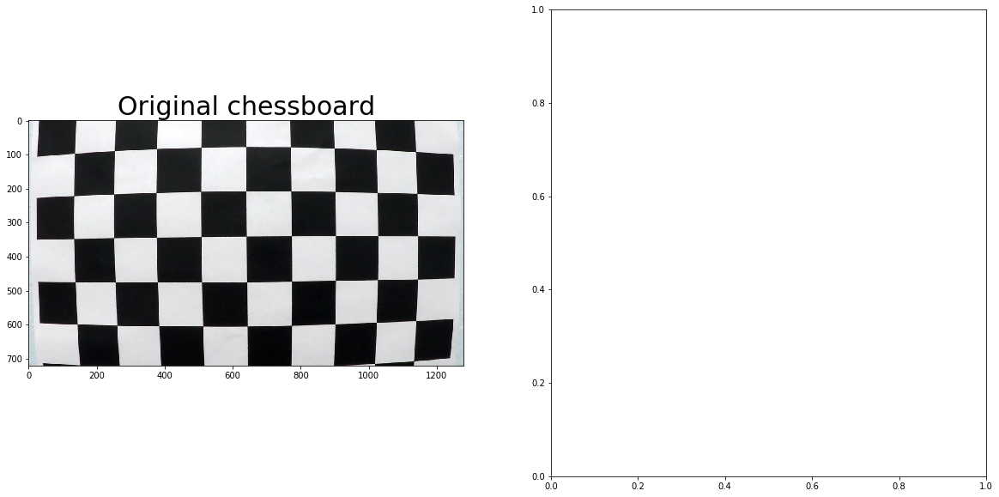

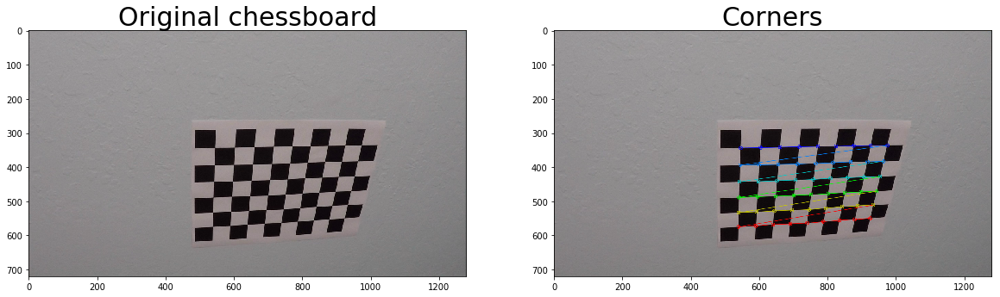

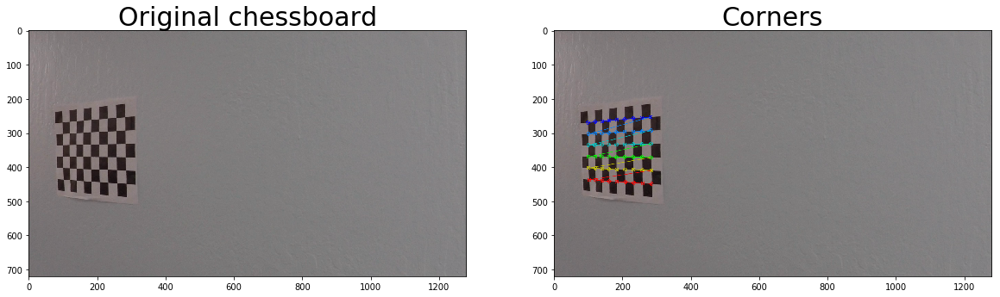

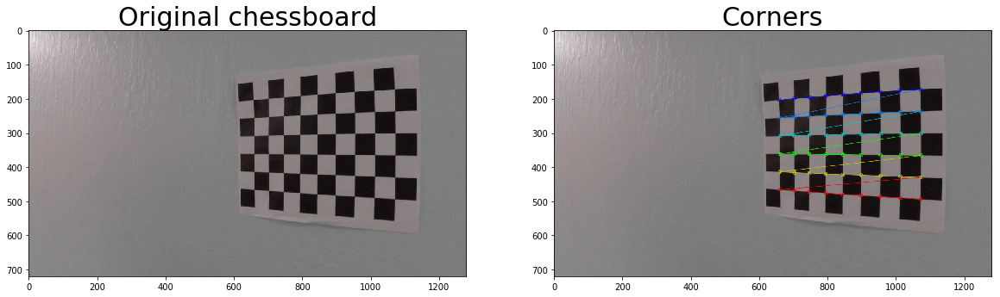

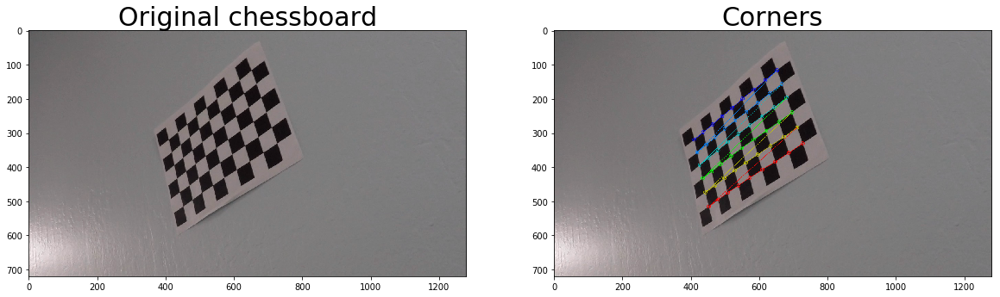

...

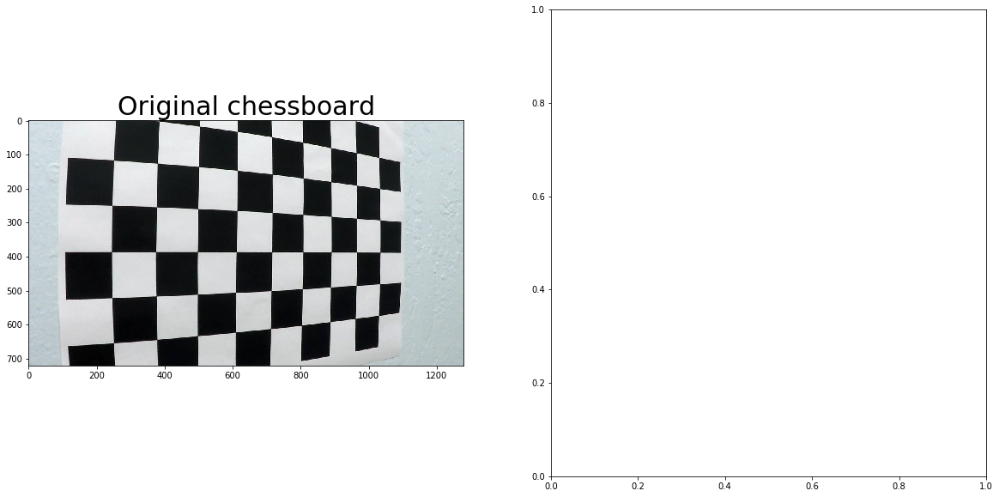

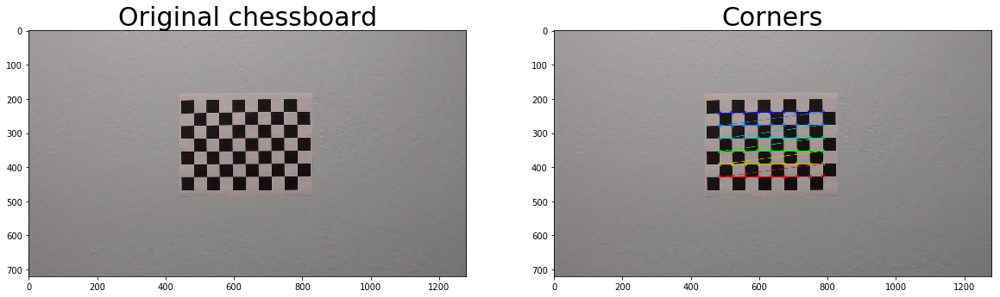

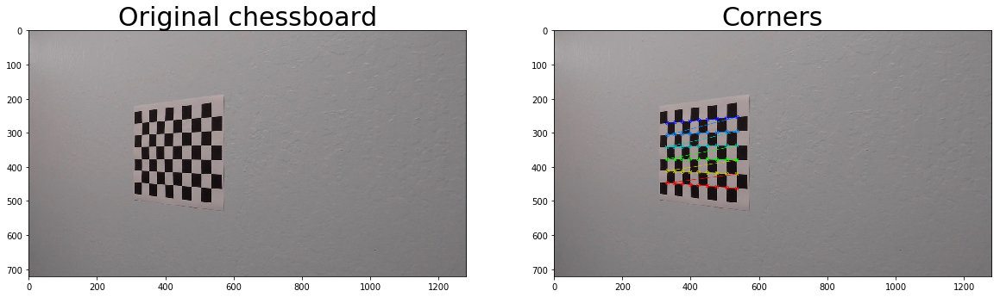

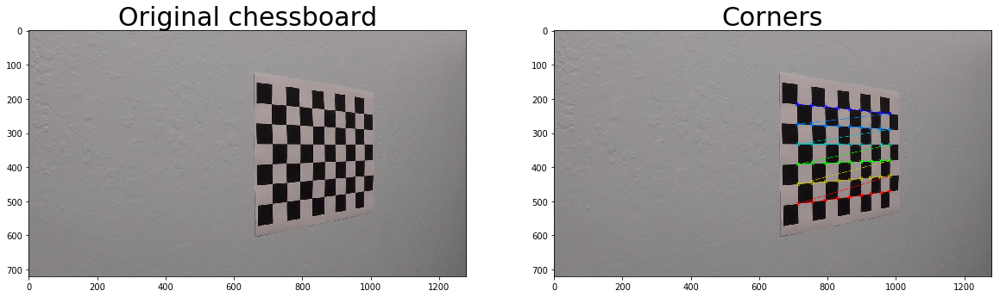

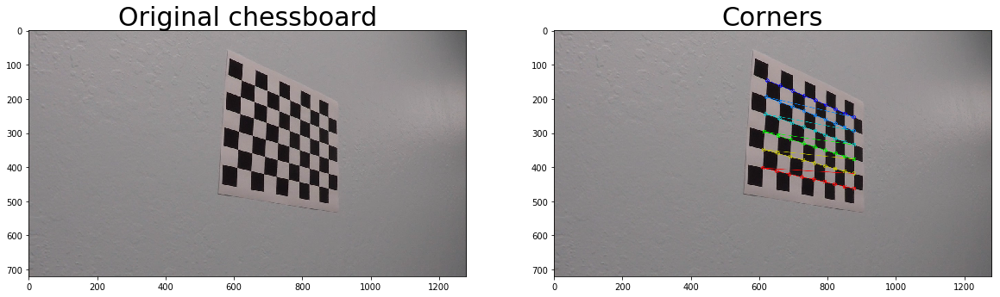

In [16]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from os.path import basename
%matplotlib inline

#shape of the matrix including all cross-over points
crossover_matrix_shape=(9,6)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((crossover_matrix_shape[1]*crossover_matrix_shape[0],3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
cal_images = glob.glob('camera_cal/calibration*.jpg')
# Step through the list and search for chessboard corners
for idx, fname in enumerate(cal_images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original chessboard', fontsize=30)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, 
                                             crossover_matrix_shape, 
                                             flags = cv2.CALIB_CB_ADAPTIVE_THRESH)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        corners = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        ax2.imshow(corners)
        ax2.set_title('Corners', fontsize=30)
        cv2.imwrite('output_images/corners/'+basename(fname),corners)
    plt.show()

## Apply a distortion correction to raw images

Next, the `objpoints` and `imgpoints` are used to compute the camera calibration and distortion coefficients using the `cv2.calibrateCamera()` function.  The  distortion correction is then applied to several test images using the `cv2.undistort()` function, and the undistorted test images are saved to *output_images/undistorted/*.

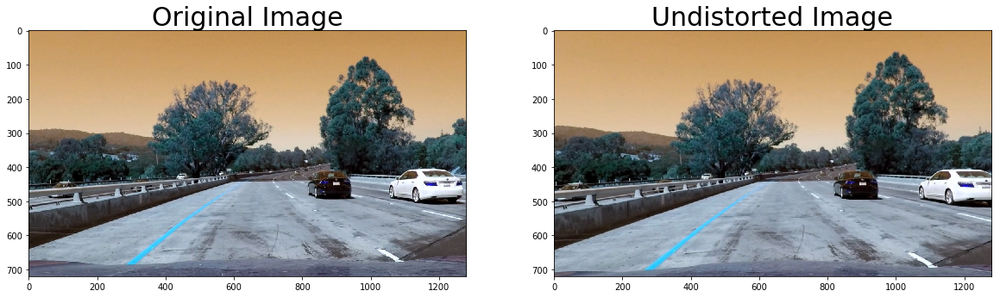

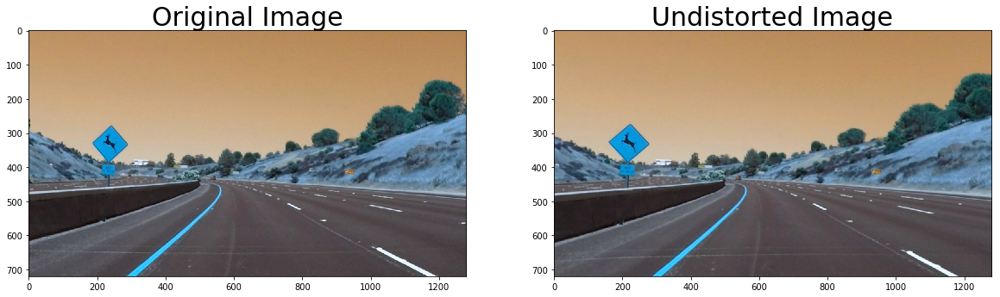

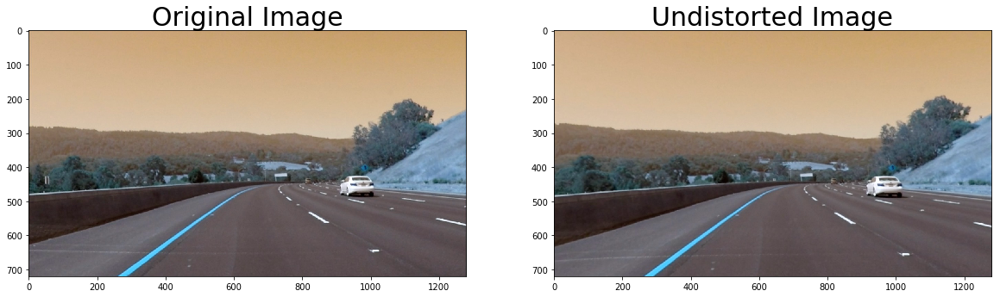

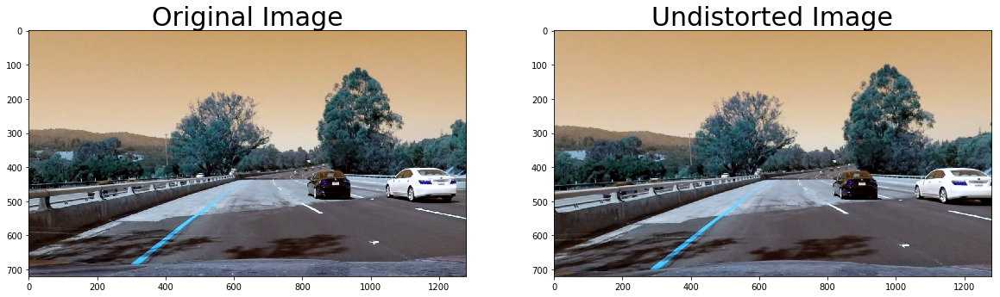

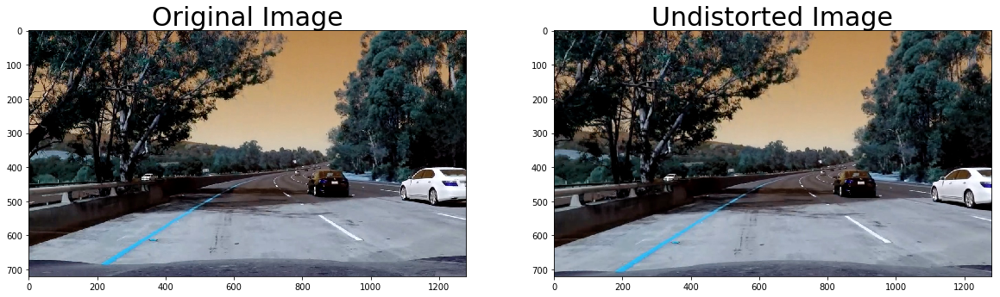

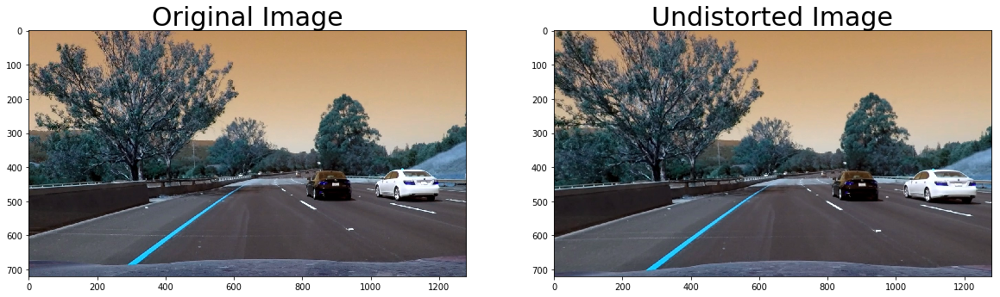

In [17]:
import pickle
%matplotlib inline
#images = glob.glob('camera_cal/calibration*.jpg')
image_paths = glob.glob('test_images/test*.jpg')
# Test undistortion on an image
for image_path in image_paths:
    img = cv2.imread(image_path)
    img_size = (img.shape[1], img.shape[0])
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)
    cv2.imwrite('output_images/undistorted/'+basename(image_path),dst)
    plt.show()

## Use color transforms, gradients, etc., to create a thresholded binary image.
In the following pipeine, the undistorted test images from the previous step are first transformed to HLS space, of which the *s_channel* is used to create a binary threshold mask. This mask is then combined with a scobel-filter mask along the x and y axis, to detect the edges in the images. The selected filters and the threshold values were found empirically and proved to generate good results. the transformed test images are saved to *output_images/transformed/*.

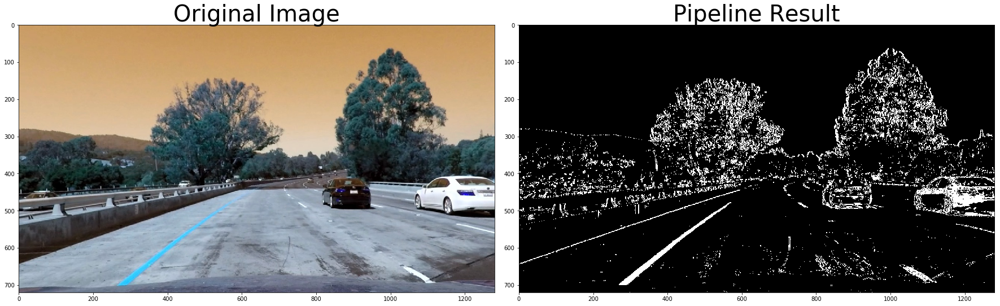

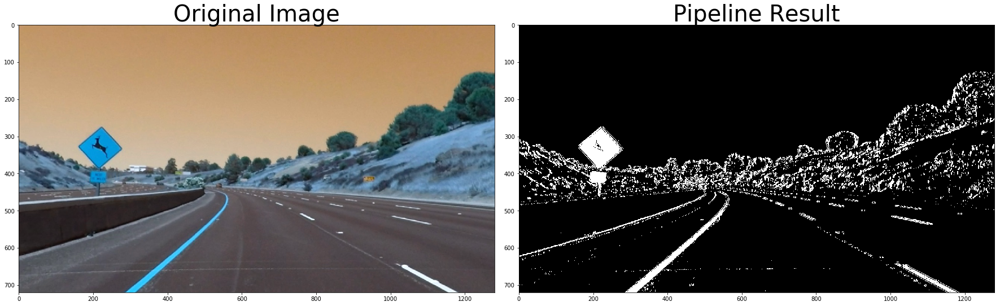

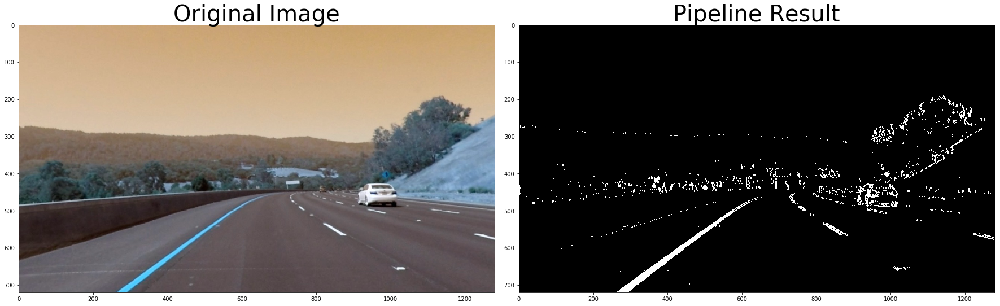

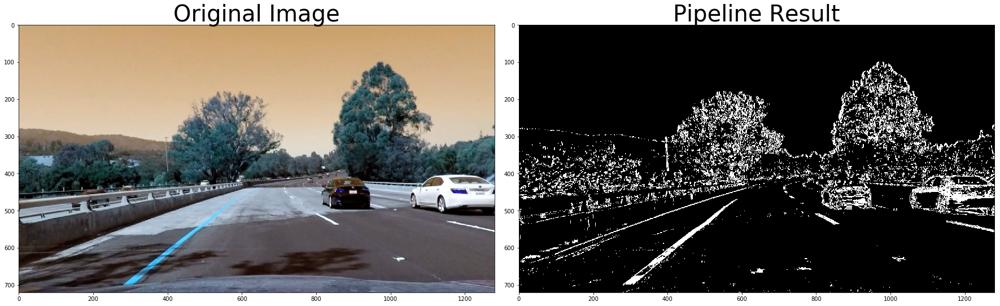

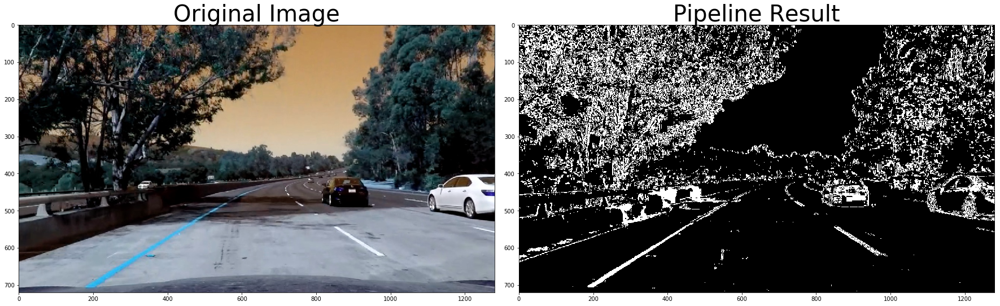

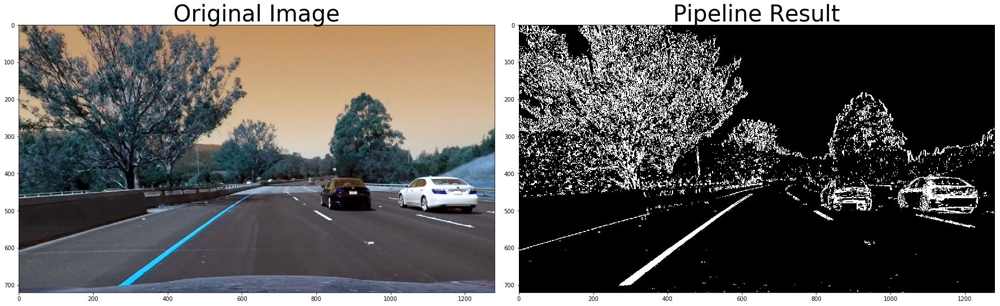

In [18]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Edit this function to create your own pipeline.
def transform(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary
 
image_paths = glob.glob('output_images/undistorted/test*.jpg')
for image_path in image_paths: 
    image = cv2.imread(image_path)
    result = transform(image)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)
    ax2.imshow(result,
               cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.imsave('output_images/transformed/'+basename(image_path),
               result,
               cmap='gray')

## Apply a perspective transform to rectify binary image ("birds-eye view")
The following code warps the test images to a bird-eye view using the *cv2.getPerspectiveTransform* and the *cv2.warpPerspective* functions. Based on a source and a destination trapezoid, *cv2.getPerspectiveTransform* generates a transformation matrix that is used by *cv2.warpPerspective* to transform the perspective of the initial image according to the source/destination mapping. The source and destination trapezoids were found empirically, by using a test image with straight lines and defining the source and destination points such that the lines in the transformed image are parallel. The warped test images are saved to *output_images/warped/*.

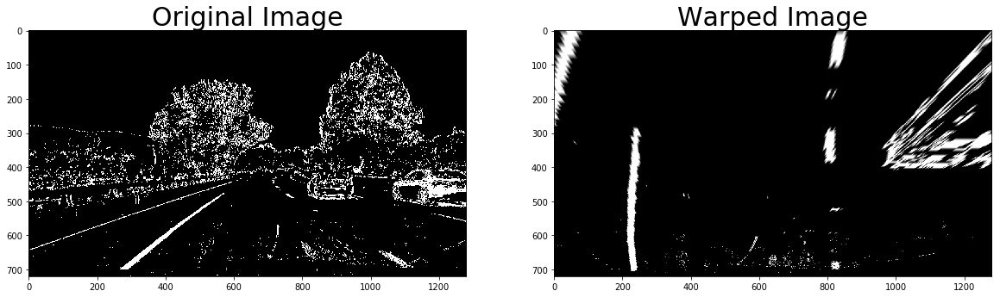

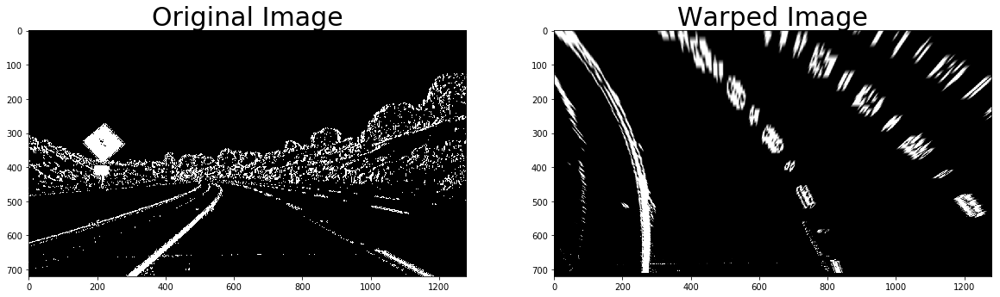

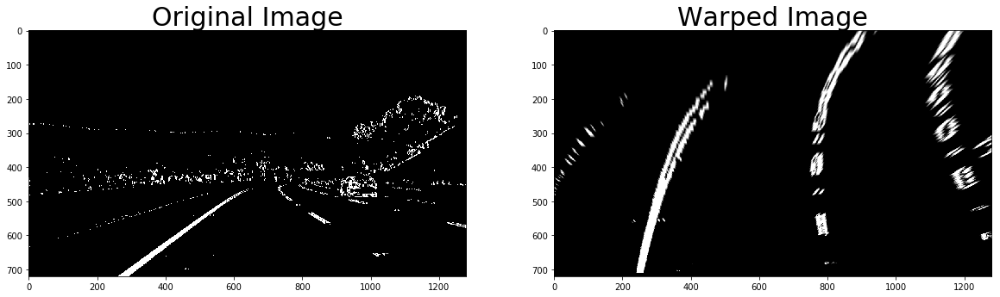

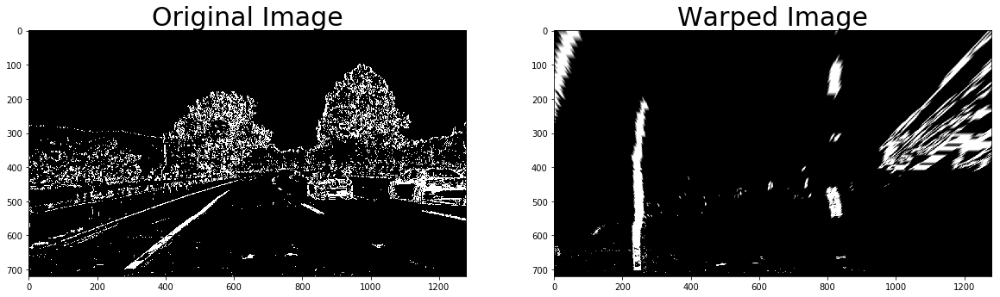

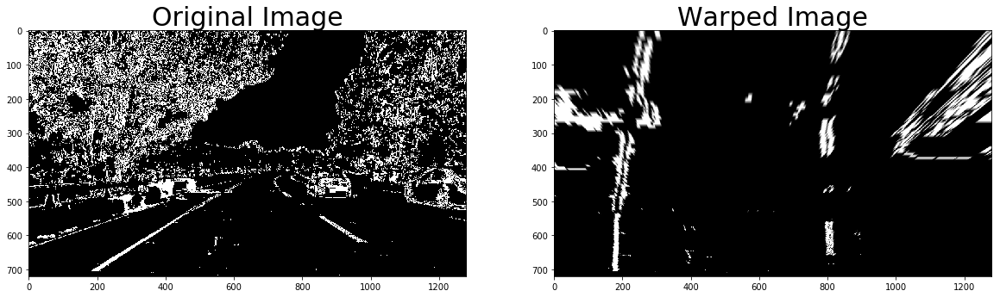

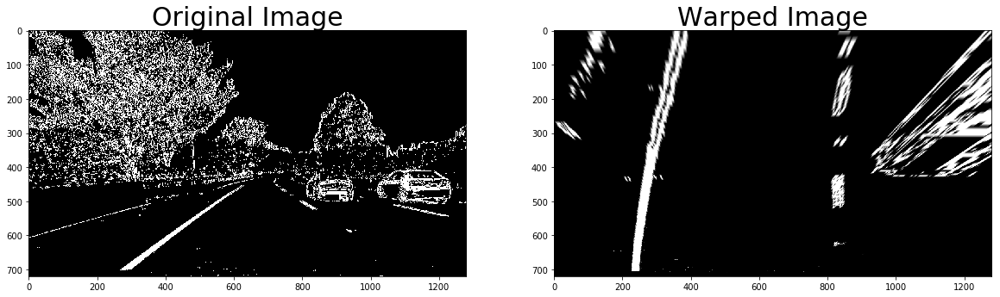

In [19]:
top_right_src = [740, 460]
top_left_src = [570, 460]
bottom_right_src = [1200, 705]
bottom_left_src = [155, 705]

top_right_dest = [870, 100]
top_left_dest = [155, 100]
bottom_right_dest = [870, 705]
bottom_left_dest = [155, 705]

# For source points I'm grabbing the outer four detected corners
src = np.float32([top_right_src,
                  bottom_right_src,
                  bottom_left_src,
                  top_left_src])
# For destination points, I'm arbitrarily choosing some points to be
# a nice fit for displaying our warped result 
# again, not exact, but close enough for our purposes
dst = np.float32([top_right_dest,
                  bottom_right_dest,
                  bottom_left_dest, 
                  top_left_dest])
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, src, dst):
    # Grab the image shape
    img_size = (img.shape[1], img.shape[0])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)
    return warped, M

image_paths = glob.glob('output_images/transformed/test*.jpg')
for image_path in image_paths: 
    image = cv2.imread(image_path)
    img_size = (image.shape[1], image.shape[0])
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints,
                                                       imgpoints,
                                                       img_size,
                                                       None,
                                                       None)

    warped_ret = corners_unwarp(image, src = src, dst = dst)
    
    if warped_ret is not None:
        warped_image = warped_ret[0]
        write_name = 'warped/warped'+str(idx)+'.jpg'
        cv2.imwrite(write_name,  dst)
        #Visualize transformation
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(image, cmap='gray')
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(warped_image, cmap='gray')
        ax2.set_title('Warped Image', fontsize=30)
        plt.show()
        plt.imsave('output_images/warped/'+basename(image_path),
                   warped_image,
                   cmap='gray')
        

## Detect lane pixels and fit to find the lane boundary
The *find_lane_fits* function below takes the transformed and warped test images, and calculates windowed histograms to detect the pixels forming a lane. It then calculates a 2nd order polinomial to fit the pixels forming the left and right lanes. The lane fits are then passed to the *draw_lanes* function, which generates an images where the lanes are marked. The test images with the lane fits are saved to *output_images/lanes/*.

C:\Users\Ralph\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:10: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


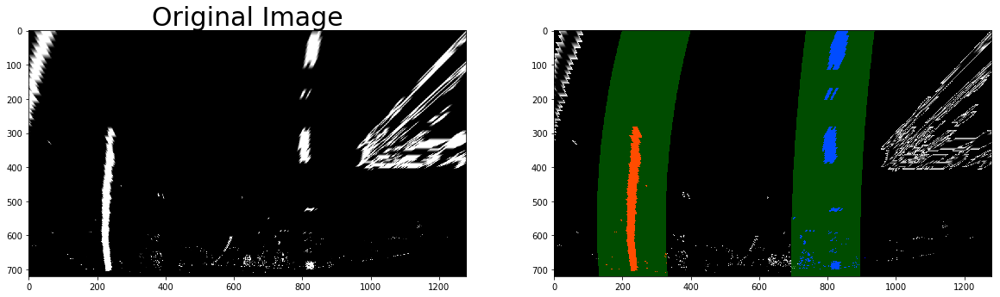

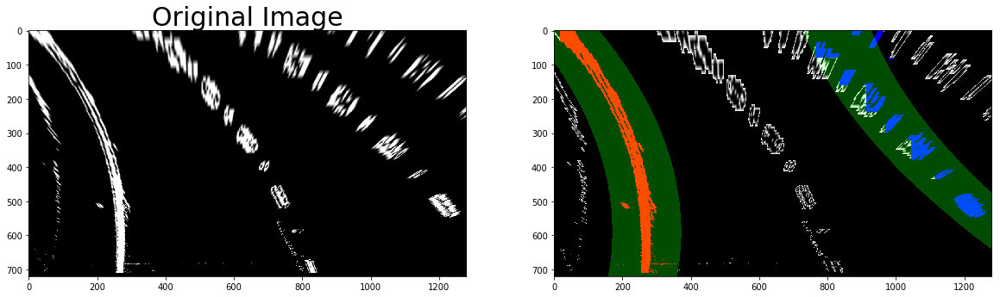

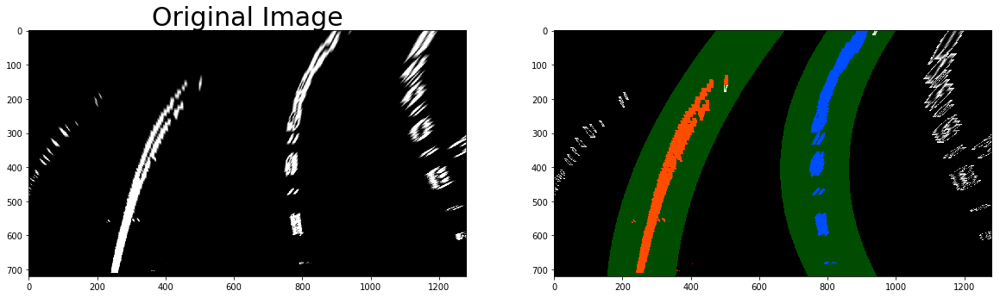

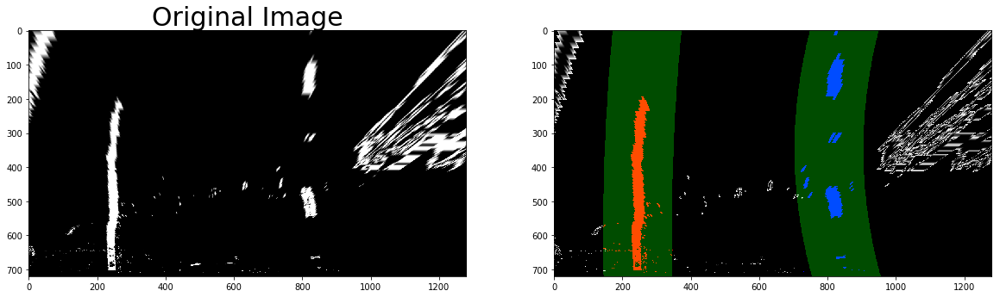

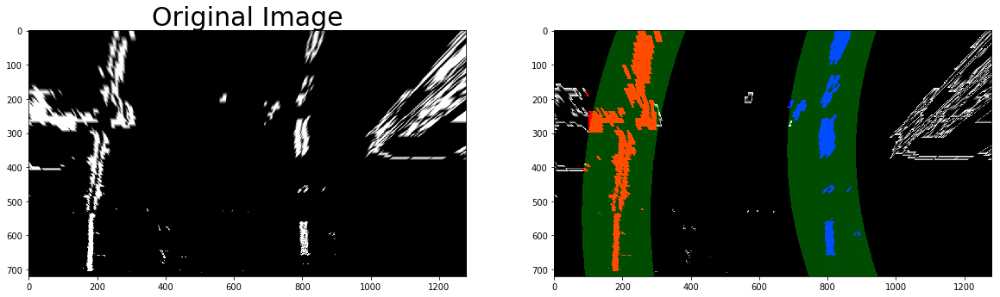

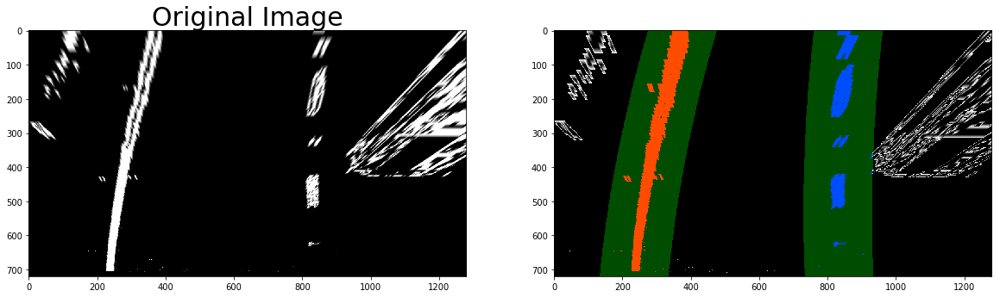

In [20]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

margin = 100

def find_lane_fits_with_sliding_window(image, margin = 100,  minpix = 50 ):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(image[image.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((image, image, image))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(image.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = image.shape[0] - (window+1)*window_height
        win_y_high = image.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &
                          (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &
                           (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    return leftx, lefty, left_fit, rightx, righty, right_fit

def find_lane_fits_based_on_previous(image,left_fit, right_fit, margin = 100):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) &
                      (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) &
                       (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
   
    return leftx, lefty, left_fit, rightx, righty, right_fit

def draw_lanes(image,leftx, lefty,left_fit, rightx, righty, right_fit):
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((image, image, image))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)   
    return result
    
image_paths = glob.glob('output_images/warped/test*.jpg')
for image_path in image_paths:
    image = cv2.imread(image_path,0)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image, cmap='gray')
    ax1.set_title('Original Image', fontsize=30)
    leftx, lefty,left_fit, rightx, righty, right_fit  = find_lane_fits_with_sliding_window(image)
    result = draw_lanes(image,leftx, lefty, left_fit,rightx, righty, right_fit)
    plt.imshow(result)
    cv2.imwrite('output_images/lanes/'+basename(image_path), result)

## Determine the curvature of the lane and vehicle position with respect to center
The radius of the found lane fits is calculated based on a formula introduced at https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/40ec78ee-fb7c-4b53-94a8-028c5c60b858/concepts/2f928913-21f6-4611-9055-01744acc344f. Since the original lane fits were calculated in pixel space and the actual curve radius has to be calculated for real world space, the values are transformed based on an estimated meter / pixel ratio. 

The position of the car relative to the image center is calculated by first finding the center between the lowest y-positions of both lanes and then subtracting this value from the image center. Again, all values are transformed to real world space. 

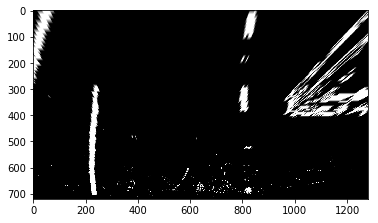

Radius of left lane: 705.689412223 m ; Radius of right lane: 1683.22810629 m
Car position relative to center: 0.6712857142857143


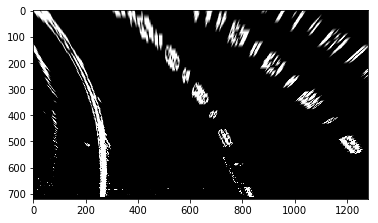

Radius of left lane: 237.145372681 m ; Radius of right lane: 233.604454395 m
Car position relative to center: -1.2368571428571429


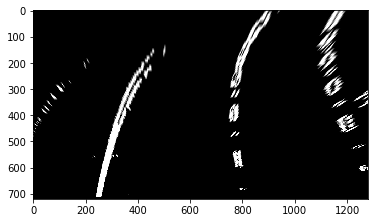

Radius of left lane: 340.75570399 m ; Radius of right lane: 198.249918489 m
Car position relative to center: 0.48100000000000004


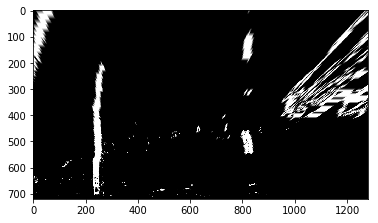

Radius of left lane: 2048.99969732 m ; Radius of right lane: 442.380858945 m
Car position relative to center: 0.48100000000000004


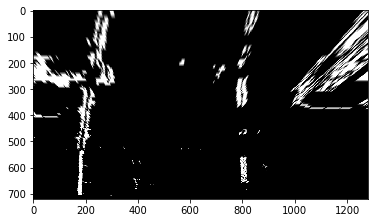

Radius of left lane: 474.785710818 m ; Radius of right lane: 344.882780269 m
Car position relative to center: 0.6395714285714286


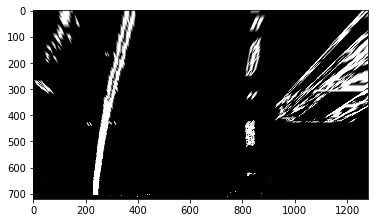

Radius of left lane: 1218.53910703 m ; Radius of right lane: 1535.94760692 m
Car position relative to center: 0.5655714285714286


In [54]:
import numpy as np
import matplotlib.pyplot as plt

def get_curve_radius(y_eval, leftx, lefty, rightx, righty):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix
                           + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix
                            + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    return left_curverad, right_curverad

def get_car_position_relative_to_center(image, left_fit, right_fit):
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    #Get the x position of the lowest point for each lane
    left_pt = left_fit[0]*image.shape[0]**2 + left_fit[1]*image.shape[0] + left_fit[2]
    right_pt = right_fit[0]*image.shape[0]**2 + right_fit[1]*image.shape[0] + right_fit[2]
    # meters from center
    screen_middel_pixel = image.shape[1]/2
    car_middle_pixel = int((right_pt + left_pt)/2)
    screen_off_center = screen_middel_pixel-car_middle_pixel
    meters_off_center = xm_per_pix * screen_off_center
    return meters_off_center

image_paths = glob.glob('output_images/warped/test*.jpg')
for image_path in image_paths:
    image = cv2.imread(image_path,0)
    plt.imshow(image, cmap='gray')
    plt.show()
    leftx, lefty, left_fit, rightx, righty, right_fit = find_lane_fits(image)
    left_curverad, right_curverad = get_curve_radius(image.shape[0],
                                                     leftx, lefty,
                                                     rightx, righty)
    print('Radius of left lane: '+str(left_curverad)+' m ;',
          'Radius of right lane: '+str(right_curverad)+' m')
    position = get_car_position_relative_to_center(image, left_fit, right_fit)
    print('Car position relative to center: '+str(position))

## Warp the detected lane boundaries back onto the original image
The following code rewarps the lane-fits back into the original image perspective by using the *corners_unwarp* function defined above and just reversing the source and destination points. The undistorted test images with the unwarped lane markers are saved to *output_images/final/*.

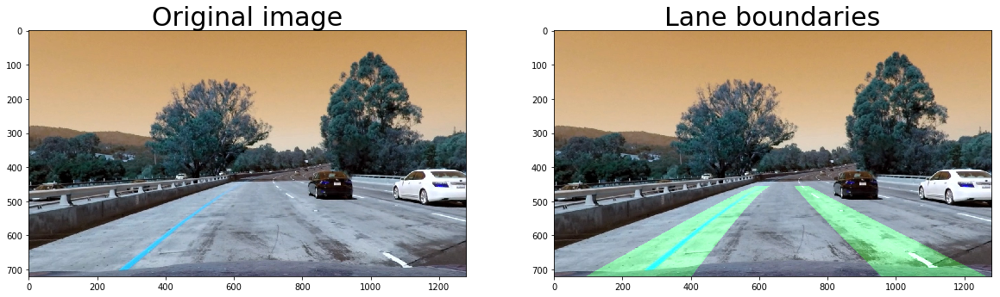

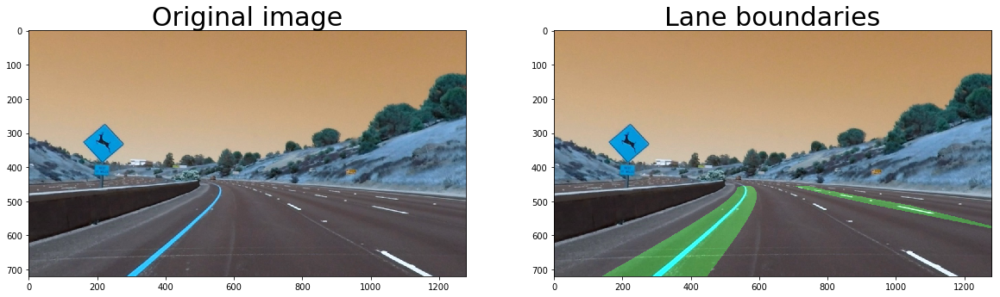

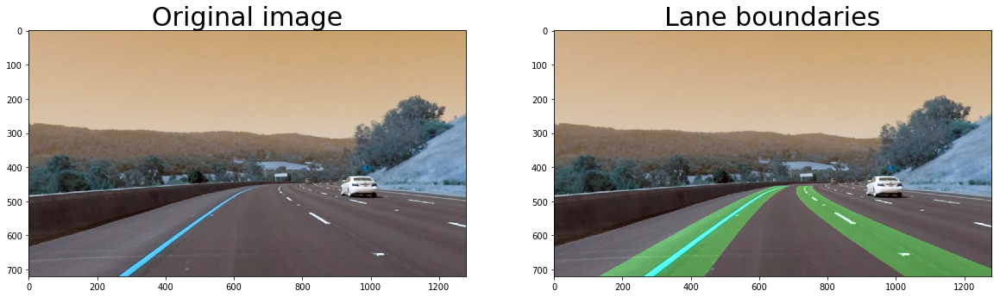

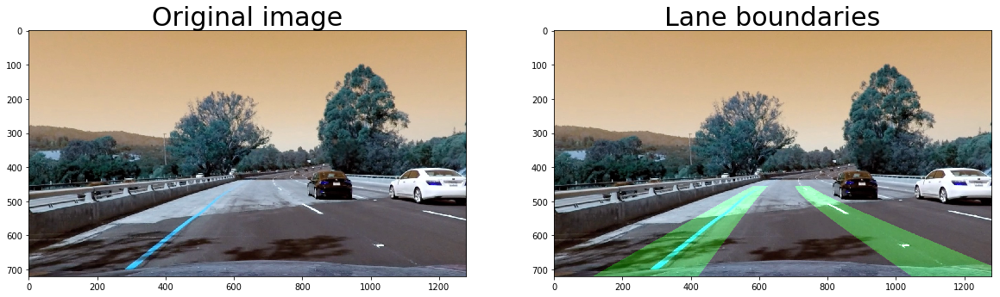

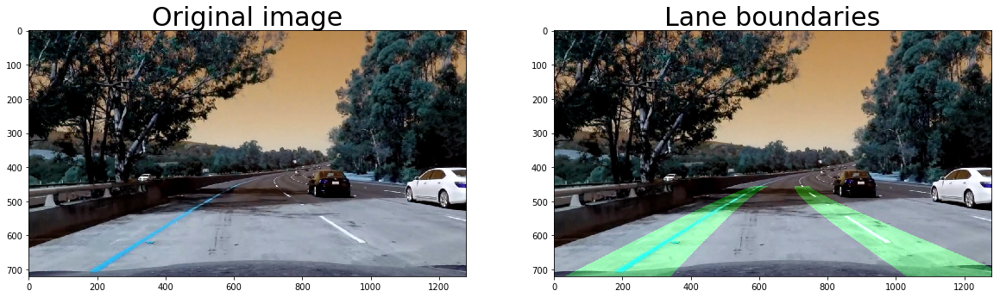

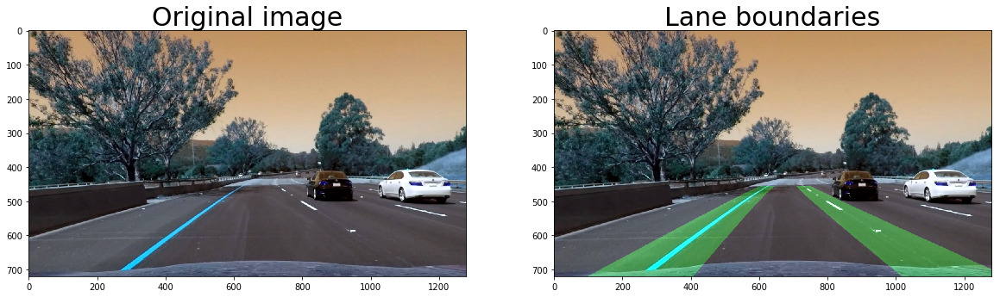

In [28]:
undistorted_paths = glob.glob('output_images/undistorted/test*.jpg')
lanes_paths = glob.glob('output_images/lanes/test*.jpg')
for images_path in zip(undistorted_paths , lanes_paths):
    undistorted = cv2.imread(images_path[0])
    lanes = cv2.imread(images_path[1])
    img_size = (lanes.shape[1], lanes.shape[0])
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints,
                                                       imgpoints,
                                                       img_size,
                                                       None,
                                                       None)

    warped_ret = corners_unwarp(lanes, src = dst, dst = src)
    
    if warped_ret is not None:
        warped_image = warped_ret[0]
        #Visualize transformation
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(undistorted)
        ax1.set_title('Original image', fontsize=30)
        result = cv2.addWeighted(undistorted, 1, warped_image, 0.3, 0)
        ax2.imshow(result)
        ax2.set_title('Lane boundaries', fontsize=30)
        plt.show()
        cv2.imwrite('output_images/final/'+basename(images_path[0]), result)

## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position
Finally, all steps from are combined in the *process* function, which calculates the lane fits for an image in one go and outputs the original image with the lane markers. This function is then used by the *fl_image* of the *moviepy.editor.VideoFileClip* class, to generate the lane markers for all frames of a video. the process function performs a few basic plausibilty checks, based on the assumption that consecutive images of a video are similar. If the radius and the position of the car are not sufficiently similar between two consecutive images, the current fit is rejected and replaced by the previous calculation. The final video is saved as *challenge_processed.mp4* 

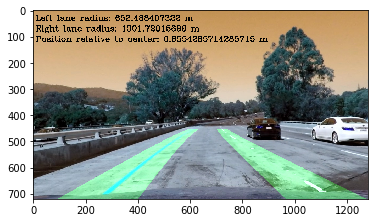

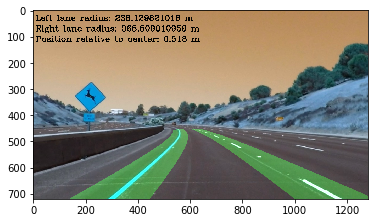

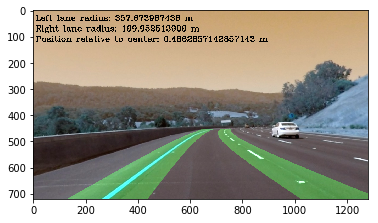

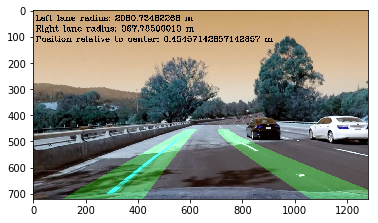

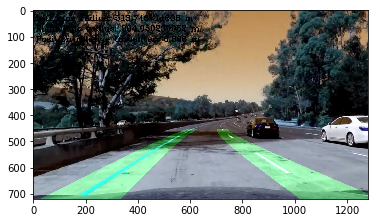

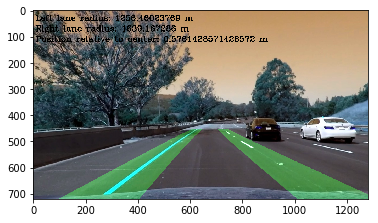

In [60]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = None  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

left = Line()
right = Line()

def fits_are_plausible(left, left_curveradius, right, right_curveradius, car_position):
    return ((np.sign(left.radius_of_curvature) == np.sign(left_curveradius)) &
            (np.sign(right.radius_of_curvature) == np.sign(right_curveradius)) &
            ((left.radius_of_curvature - left_curveradius) < 0.2) %
            ((right.radius_of_curvature - right_curveradius) < 0.2) %
            (abs(left.line_base_pos-car_position) <0.2)) 

def process(image, video = True):
    img_size = (image.shape[1], image.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    undistorted_image = cv2.undistort(image, mtx, dist, None, mtx)
    transformed_image = transform(undistorted_image)
    M = cv2.getPerspectiveTransform(src, dst)
    warped_image = cv2.warpPerspective(transformed_image, M, img_size)
    if left.current_fit is not None and right.current_fit is not None and video is True:
         leftx,lefty, left_fit, rightx, righty, right_fit  = find_lane_fits_based_on_previous(warped_image,
                                                                                             left.current_fit,
                                                                                             right.current_fit)
    else:
         leftx,lefty, left_fit, rightx, righty, right_fit  = find_lane_fits_with_sliding_window(warped_image)
    left_curverad, right_curverad = get_curve_radius(image.shape[0],
                                                     leftx, lefty,
                                                     rightx, righty)
    position = get_car_position_relative_to_center(image, left_fit, right_fit)
    
    if left.current_fit is not None and right.current_fit is not None and video is True:
        if not fits_are_plausible(left,left_curverad, right, right_curverad,position):
            left_fit = left.current_fit
            right_fit = right.current_fit
            right_curverad = right.radius_of_curvature
            left_curverad = left.radius_of_curvature
            position = left.line_base_pos 
 
    left.current_fit = left_fit
    right.current_fit = right_fit
    left.radius_of_curvature = left_curverad
    right.radius_of_curvature = right_curverad
    left.line_base_pos = position 
    right.line_base_pos = position 
    lanes = draw_lanes(warped_image, left_fit, right_fit)
    M = cv2.getPerspectiveTransform(dst, src)
    unwarped_lanes = cv2.warpPerspective(lanes, M, img_size)
    result = cv2.addWeighted( undistorted_image, 1, unwarped_lanes, 0.3, 0)
    left_radius_text = 'Left lane radius: '+str(left_curverad)+' m'
    right_radius_text = 'Right lane radius: '+str(right_curverad)+' m'
    position_text = 'Position relative to center: '+str(position)+' m'
    cv2.putText(result, left_radius_text,(10,40),cv2.FONT_HERSHEY_COMPLEX, 1,(0,0,0),2)
    cv2.putText(result, right_radius_text,(10,80),cv2.FONT_HERSHEY_COMPLEX, 1,(0,0,0),2)
    cv2.putText(result,  position_text,(10,120),cv2.FONT_HERSHEY_COMPLEX, 1,(0,0,0),2)
    return result

image_paths = glob.glob('test_images/test*.jpg')
for image_path in image_paths:
    image = cv2.imread(image_path)
    result = process(image, False)
    plt.imshow(result)
    plt.show()

In [62]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
video_output = 'challenge_processed.mp4'
clip1 = VideoFileClip("challenge.mp4")
video_clip = clip1.fl_image(process) #NOTE: this function expects color images!!
video_clip.write_videofile(video_output, audio=False)
print ("done")

[MoviePy] >>>> Building video challenge_processed.mp4
[MoviePy] Writing video challenge_processed.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 251/251 [16:49<00:00,  4.34s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_processed.mp4 

done
